In [1]:
# 데이터 셋 및 라이브러리
import librosa
import librosa.display

import IPython.display as ipd

import numpy as np
import matplotlib.pyplot as plt

import soundfile as sf
from matplotlib.gridspec import GridSpec

audio_path_vocal = 'C:/Users/kbg46/Desktop/신호 및 시스템 연구과제/Jupyter/signal_original vocal sample.wav'
audio_path_comparison = 'C:/Users/kbg46/Desktop/신호 및 시스템 연구과제/Jupyter/signal_filter with Fl studio interior plugin.wav'

sample_Rate = 16000 #사람 목소리의 경우 16000hz로 샘플링한다.

ipd.Audio(audio_path_vocal)
ipd.Audio(audio_path_comparison)

sr: 16000 , audio shape: (544000,)
length: 34.0 secs
sr: 16000 , audio shape: (544000,)
length: 34.0 secs
sr: 16000 , audio shape: (544000,)
length: 34.0 secs


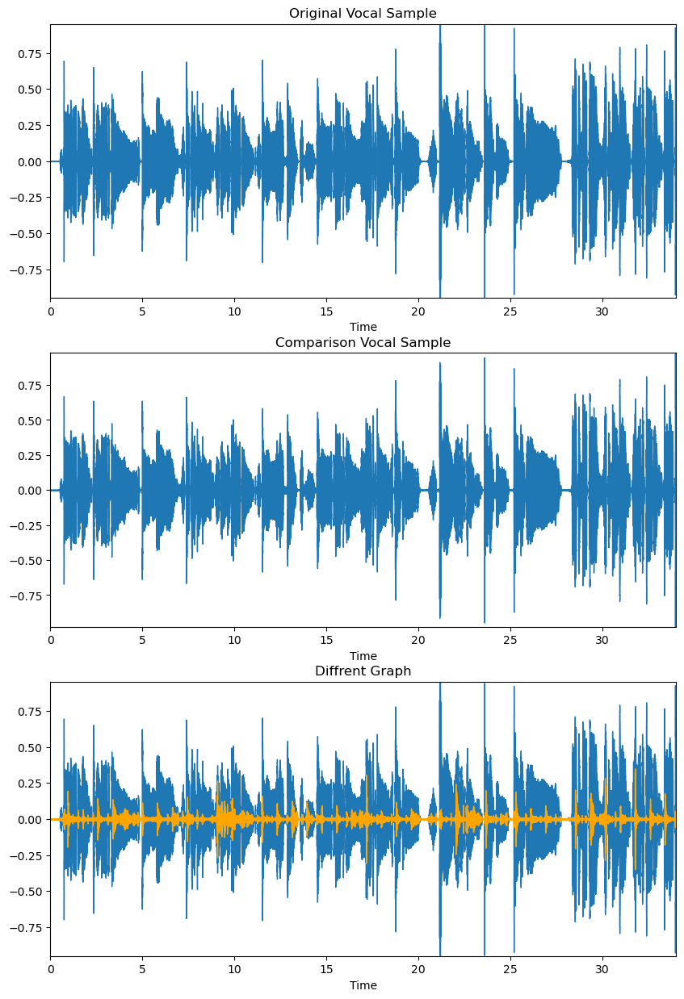

In [2]:
# 파형 y: 파형의 amplitude, sr:샘플링 레이트
Vocal_Original, sr = librosa.load(audio_path_vocal, sr=sample_Rate, duration=34)
print('sr:', sr, ', audio shape:', Vocal_Original.shape)
print('length:', Vocal_Original.shape[0]/float(sr), 'secs')

Vocal_comparison, sr = librosa.load(audio_path_comparison, sr=sample_Rate, duration=34)
print('sr:', sr, ', audio shape:', Vocal_comparison.shape)
print('length:', Vocal_comparison.shape[0]/float(sr), 'secs')


Vocal_diffrent = Vocal_Original - Vocal_comparison
print('sr:', sr, ', audio shape:', Vocal_diffrent.shape)
print('length:', Vocal_comparison.shape[0]/float(sr), 'secs')

gs = GridSpec(3,1)
fig = plt.figure(figsize = (10,15))
ax1 = fig.add_subplot(gs[0])
ax2 = fig.add_subplot(gs[1])
ax3 = fig.add_subplot(gs[2])

#시각화
librosa.display.waveshow(Vocal_Original, sr=sr, ax=ax1)
ax1.set_title("Original Vocal Sample")

librosa.display.waveshow(Vocal_comparison, sr=sr, ax=ax2)
ax2.set_title("Comparison Vocal Sample")

librosa.display.waveshow(Vocal_Original, sr=sr, ax=ax3)
librosa.display.waveshow(Vocal_diffrent, sr=sr, ax=ax3, color='orange')
ax3.set_title("Diffrent Graph")

ax1.margins(x=0,y=0)
ax2.margins(x=0,y=0)
ax3.margins(x=0,y=0)

# sf.write('Diffrent.wav', Vocal_diffrent, sr, subtype='PCM_24')

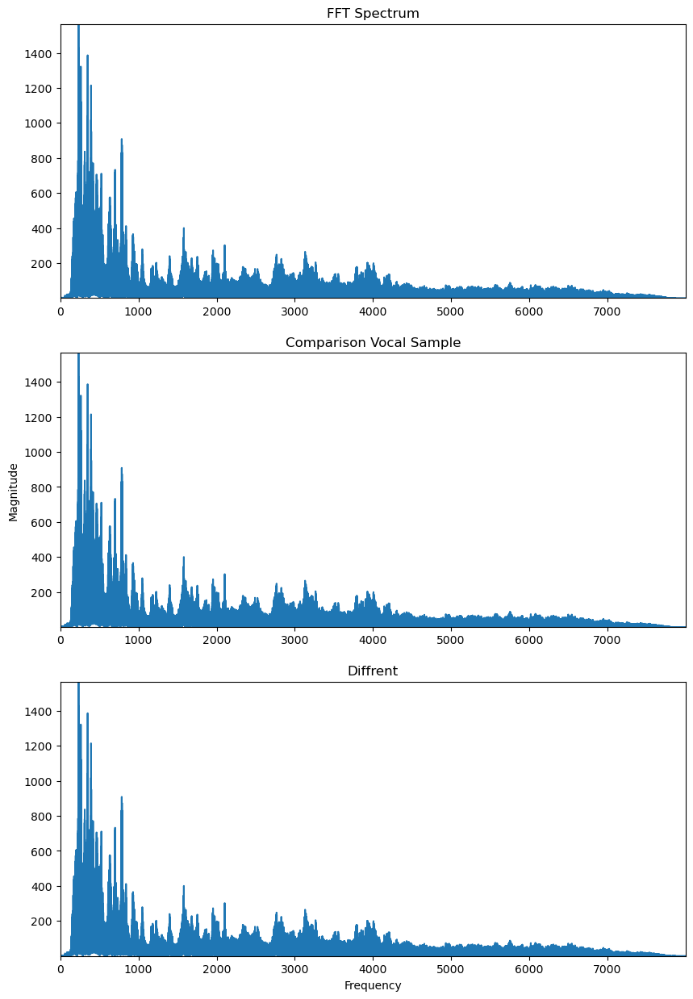

In [3]:
#FFT, Fast Fourier Transform
#time 영역의 그래프를 frequency 영역으로 변환
# 주파수 분석, Fourier -> Specturm

fft_original = np.fft.fft(Vocal_Original)
fft_comparison = np.fft.fft(Vocal_comparison)
fft_diffrent = np.fft.fft(Vocal_diffrent)

#Original
magnitude = np.abs(fft_original)
frequency = np.linspace(0,sr,len(magnitude))

left_spectrum = magnitude[:int(len(magnitude)/2)]
left_frequency = frequency[:int(len(frequency)/2)]

#Comparison
magnitude_comparison = np.abs(fft_comparison)
frequency_comparison = np.linspace(0,sr,len(magnitude_comparison))

left_spectrum_comparison = magnitude[:int(len(magnitude_comparison)/2)]
left_frequency_comparison = frequency[:int(len(frequency_comparison)/2)]

#Diffrent
magnitude_diffrent = np.abs(fft_diffrent)
frequency_diffrent = np.linspace(0,sr,len(magnitude_diffrent))

left_spectrum_Diffrent = magnitude[:int(len(magnitude_diffrent)/2)]
left_frequency_Diffrent = frequency[:int(len(frequency_diffrent)/2)]

gs = GridSpec(3,1)
fig = plt.figure(figsize = (10,15))
ax1 = fig.add_subplot(gs[0])
ax2 = fig.add_subplot(gs[1])
ax3 = fig.add_subplot(gs[2])

ax1.set_title("FFT Spectrum")

ax2.set_title("Comparison Vocal Sample")
ax2.set_ylabel("Magnitude")

ax3.set_title("Diffrent")
ax3.set_xlabel("Frequency", loc='center')

ax1.plot(left_frequency, left_spectrum)
ax2.plot(left_frequency_comparison, left_spectrum_comparison)
ax3.plot(left_frequency_Diffrent, left_spectrum_Diffrent)

ax1.margins(x=0,y=0)
ax2.margins(x=0,y=0)
ax3.margins(x=0,y=0)


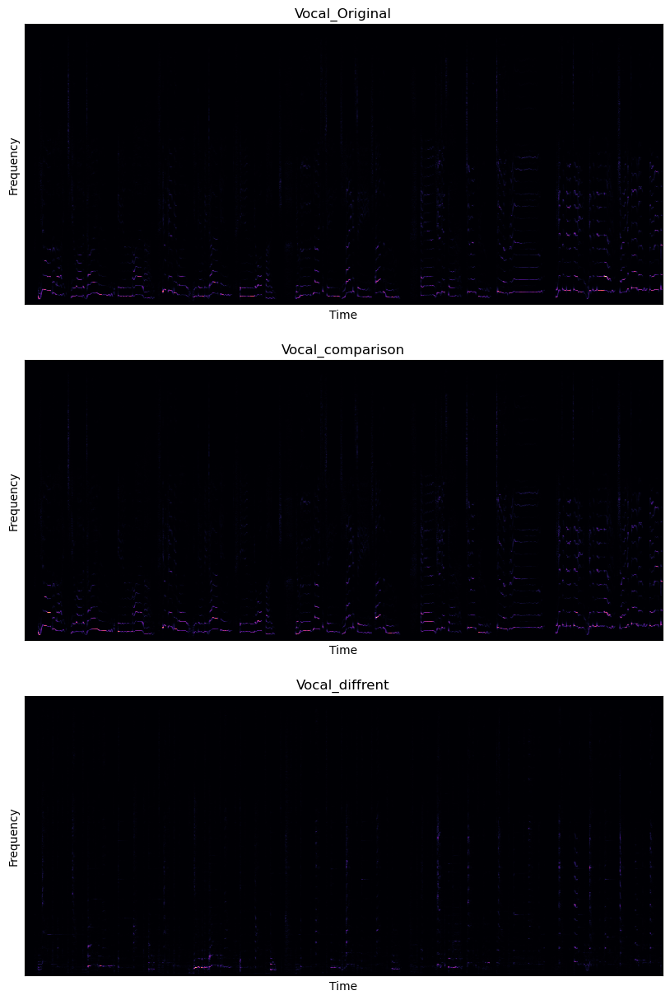

In [4]:
#STFT, Short-Time Fourier Transform
#시간 정보 유실 방지를 위해, 사전에 정의한 시간의 간격(window, frame) 단위로 쪼개어 푸리에 변환
#window의 크기(n_fft)와 window 간에 겹치는 사이즈(hop_length)를 설정한다. 일반적으로는 n_fft의 1/4 정도가 겹치도록 설정한다고 한다.

#win_length는 FFT를 할 때 참조할 그래프의 길이
#hop_length는 얼마만큼 시간 주기를 이동하면서 분석할 것인 지에 대한 매개변수, 칼라맵의 시간 주기
#n_fft는 win_length보가 길 경우 모두 zero padding 처리를 위한 매개변수

n_fft = 2048 
hop_length = 512

stft = librosa.stft(Vocal_Original, n_fft = n_fft, hop_length = hop_length)
spectrogram = np.abs(stft)
# print("Spectogram :\n", spectrogram)

#Comparison
stft_comparison = librosa.stft(Vocal_comparison, n_fft = n_fft, hop_length = hop_length)
spectrogram_comparison = np.abs(stft_comparison)
# print("Spectogram :\n", spectrogram_comparison)

#Diffrent
stft_diffrent = librosa.stft(Vocal_diffrent, n_fft = n_fft, hop_length = hop_length)
spectrogram_diffrent = np.abs(stft_diffrent)
# print("Spectogram :\n", spectrogram_diffrent)

#Spectogram, 주파수의 정도를 색깔로 확인하기 vocal original
gs = GridSpec(3,1)
fig = plt.figure(figsize = (10,15))
ax1 = fig.add_subplot(gs[0])
ax2 = fig.add_subplot(gs[1])
ax3 = fig.add_subplot(gs[2])
#Spectogram, 주파수의 정도를 색깔로 확인하기 vocal original

librosa.display.specshow(spectrogram, sr=sr, hop_length=hop_length, ax=ax1)
ax1.set_title("Vocal_Original")
ax1.set_xlabel("Time")
ax1.set_ylabel("Frequency")

#Spectogram, 주파수의 정도를 색깔로 확인하기 comparison vocal

librosa.display.specshow(spectrogram_comparison, sr=sr, hop_length=hop_length, ax=ax2)
ax2.set_title("Vocal_comparison")
ax2.set_xlabel("Time")
ax2.set_ylabel("Frequency")

#Spectogram, 주파수의 정도를 색깔로 확인하기 diffrent vocal

librosa.display.specshow(spectrogram_diffrent, sr=sr, hop_length=hop_length, ax=ax3)
ax3.set_title("Vocal_diffrent")
ax3.set_xlabel("Time")
ax3.set_ylabel("Frequency")

plt.plasma()

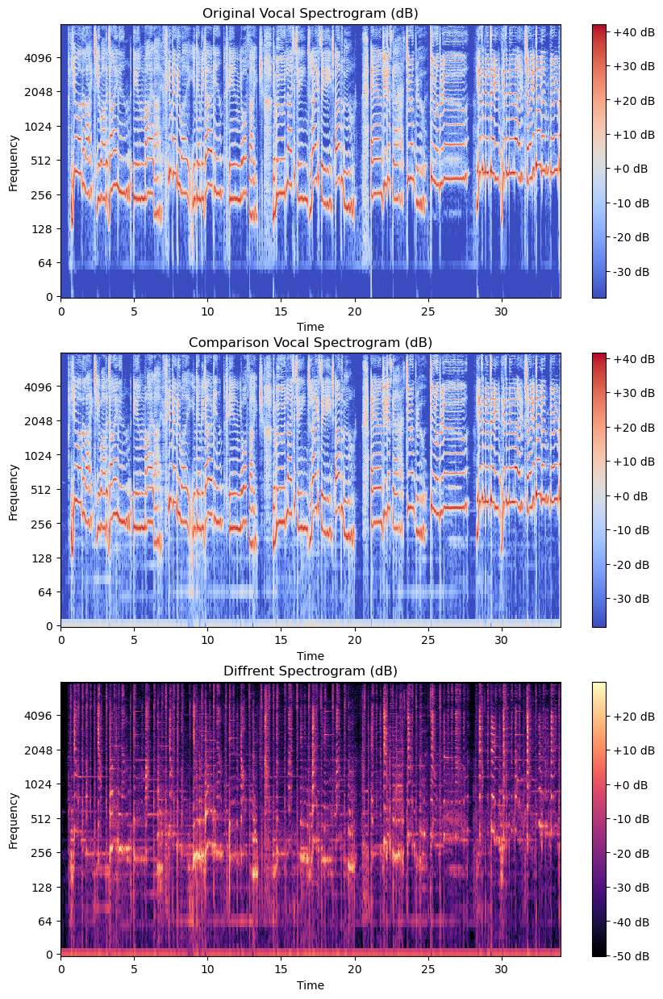

In [5]:
#Log-spectogram, dB 스케일링을 적용한 것, 사람의 청각도 dB 스케일로 인식하기에 분석에 용이함
log_spectrogram = librosa.amplitude_to_db(spectrogram)
log_spectrogram_comparison = librosa.amplitude_to_db(spectrogram_comparison)
log_spectrogram_diffrent = librosa.amplitude_to_db(spectrogram_diffrent)

gs = GridSpec(3,1)
fig = plt.figure(figsize = (10,15))
ax1 = fig.add_subplot(gs[0])
ax2 = fig.add_subplot(gs[1])
ax3 = fig.add_subplot(gs[2])

#OG
log1 = librosa.display.specshow(log_spectrogram, sr=sr, hop_length=hop_length, x_axis='time', y_axis='log', ax=ax1)
ax1.set_xlabel("Time")
ax1.set_ylabel("Frequency")
ax1.set_title("Original Vocal Spectrogram (dB)")

#COM
log2 = librosa.display.specshow(log_spectrogram_comparison, sr=sr, hop_length=hop_length, x_axis='time', y_axis='log', ax=ax2)
ax2.set_xlabel("Time")
ax2.set_ylabel("Frequency")
ax2.set_title("Comparison Vocal Spectrogram (dB)")

#DIFF
log3 = librosa.display.specshow(log_spectrogram_diffrent, sr=sr, hop_length=hop_length, x_axis='time', y_axis='log', ax=ax3)
ax3.set_xlabel("Time")
ax3.set_ylabel("Frequency")
ax3.set_title("Diffrent Spectrogram (dB)")

plt.colorbar(log1, format="%+2.0f dB")
plt.colorbar(log2, format="%+2.0f dB")
plt.colorbar(log3, format="%+2.0f dB")

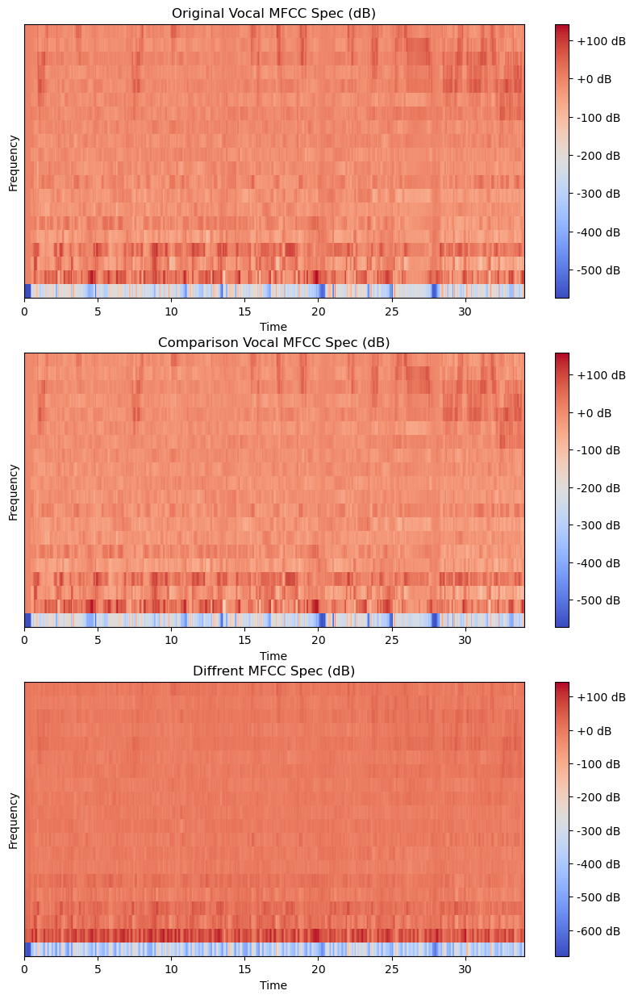

In [6]:
#MFCC, Mel Frequency Cepstral Coefficient
#오디오 신호 처리 분야에서 많이 사용되는 소리 데이터의 특징값
#사람의 청각이 예민하게 반응하는 정보를 강조하여 소리가 가지는 고유한 특징을 추출한 값

#librosa.feature.mfcc(audio, sr, n_mfcc, n_fft, hop_length)
#sr, 디폴트는 22050Hz, 앞서 16000Hz로 샘플을 로드했기 때문에 16000로 삽입, 사람 목소리 대부분은 16000Hz 안에 포함된다고함
#n_mfcc, return 될 mfcc의 개수를 정해주는 파라미터, 디폴트 20
#n_fft, win_length보다 길 경우 모두 zero padding해서 처리하기 위한 파라미터 default는 win_length와 같다.
#일반적으로 자연어 처리에서 음성을 25m 크기 기본, 16000Hz인 음성에서 400에 해당함(16000*0.025) 즉,n_fft는 sr에 frame_length인 0.025 곱한 값임

#hop_length, 얼마만큼 시간 주기를 이동하면서 분석을 할 것인지에 대한 파라미터, 10ms를 기본으로 하고 있어 16000Hz인 음성에서는 160에 해당한다.(16000 * 0.01 = 160) 
#즉, hop_length는 sr에 frame_stride인 0.01를 곱해서 구할 수 있다.

#window_length가 0.025이고 frame_stride가 0.01이라고 하면 0.015초씩은 데이터를 겹치면서 읽는다.

mfcc = librosa.feature.mfcc(y=Vocal_Original, sr=sample_Rate, n_mfcc=20, n_fft=n_fft, hop_length=hop_length)
mfcc_comparison = librosa.feature.mfcc(y=Vocal_comparison, sr=sample_Rate, n_mfcc=20, n_fft=n_fft, hop_length=hop_length)
mfcc_diffrent = librosa.feature.mfcc(y=Vocal_diffrent, sr=sample_Rate, n_mfcc=20, n_fft=n_fft, hop_length=hop_length)

# print("MFCC Shape: ", mfcc.shape)
# print("MFCC: \n", mfcc)

gs = GridSpec(3,1)
fig = plt.figure(figsize = (10,15))
ax1 = fig.add_subplot(gs[0])
ax2 = fig.add_subplot(gs[1])
ax3 = fig.add_subplot(gs[2])

#OG 시각화
mel1 = librosa.display.specshow(mfcc, sr=sample_Rate, hop_length=hop_length, x_axis='time', ax=ax1)
ax1.set_title("Original Vocal MFCC Spec (dB)")
ax1.set_xlabel("Time")
ax1.set_ylabel("Frequency")
plt.colorbar(mel1, format='%+2.0f dB')

#COM 시각화

mel2 = librosa.display.specshow(mfcc_comparison, sr=sample_Rate, hop_length=hop_length, x_axis='time', ax=ax2)
ax2.set_title("Comparison Vocal MFCC Spec (dB)")
ax2.set_xlabel("Time")
ax2.set_ylabel("Frequency")
plt.colorbar(mel2,format='%+2.0f dB')


#DIFF 시각화
mel3 = librosa.display.specshow(mfcc_diffrent, sr=sample_Rate, hop_length=hop_length, x_axis='time', ax=ax3)
ax3.set_title("Diffrent MFCC Spec (dB)")
ax3.set_xlabel("Time")
ax3.set_ylabel("Frequency")
plt.colorbar(mel3, format='%+2.0f dB')
